In [39]:
import argparse
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import math
import pickle
import sys

import torch
from torch.utils import data
from torch.utils.data.dataloader import default_collate
from torch.autograd import Variable

from models.unet import UNet

In [40]:
# pretrained_weights_path = '/scratch/ainaz/omnidata2/exps/checkpoints/omnidata/3ef56j3n/epoch=157.ckpt'
# pretrained_weights_path = '/scratch/ainaz/omnidata2/experiments/normal/checkpoints/omnidata/49j20rhe/last.ckpt'
pretrained_weights_path = '/scratch/ainaz/XTConsistency/models/rgb2normal_baseline.pth'

In [41]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = UNet(in_channels=3, out_channels=3)

checkpoint = torch.load(pretrained_weights_path, map_location='cuda:0')
if 'state_dict' in checkpoint:
    state_dict = {}
    for k, v in checkpoint['state_dict'].items():
        state_dict[k.replace('model.', '')] = v
else:
      state_dict = checkpoint
model.load_state_dict(state_dict)
model.to(device)

UNet(
  (down1): UNet_down_block(
    (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): GroupNorm(8, 16, eps=1e-05, affine=True)
    (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): GroupNorm(8, 16, eps=1e-05, affine=True)
    (conv3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn3): GroupNorm(8, 16, eps=1e-05, affine=True)
    (max_pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (relu): ReLU()
  )
  (down_blocks): ModuleList(
    (0): UNet_down_block(
      (conv1): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): GroupNorm(8, 32, eps=1e-05, affine=True)
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): GroupNorm(8, 32, eps=1e-05, affine=True)
      (conv3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn3): GroupNorm(8, 32, eps=1e-05, affine=True)


# Dataloader

In [42]:
class OASISNormalDataset(data.Dataset):
    def __init__(self, csv_filename, data_aug=False, img_size=256):
        super(OASISNormalDataset, self).__init__()
        print("=====================================================")
        print("Using OASISNormalDataset...")
        print("csv file name: %s" % csv_filename)

        img_names = []
        normal_names = []

        with open(csv_filename) as infile:
            next(infile) # skip header
            for line in infile:
                # Filenames are absolute directories
                img_name,_,_,normal_name,_,_,_,_,_,_,_,_,_,_ = line.split(',')
                if len(normal_name) == 0:
                    continue
                img_names.append(os.path.join('/scratch/ainaz', img_name.strip()))
                normal_names.append(os.path.join('/scratch/ainaz', normal_name.strip()))
    
        self.img_names = img_names
        self.normal_names = normal_names
        self.width = img_size #320
        self.height = img_size #240
        self.n_sample = len(self.img_names)

        self.data_aug = data_aug
        print("Network input width = %d, height = %d" % (self.width, self.height))
        print("%d samples" % (self.n_sample))
        print("Data augmentation: {}".format(self.data_aug))
        print("=====================================================")

    def __getitem__(self, index):
        color = cv2.imread(self.img_names[index]).astype(np.float32)
        normal_file = open(self.normal_names[index], 'rb')
        normal_dict = pickle.load(normal_file)


        h,w,c = color.shape
        mask = np.zeros((h,w))
        normal = np.zeros((h,w,c))

        # Stuff ROI normal into bounding box
        min_y = normal_dict['min_y']
        max_y = normal_dict['max_y']
        min_x = normal_dict['min_x']
        max_x = normal_dict['max_x']
        roi_normal = normal_dict['normal']
        try:
            normal[min_y:max_y+1, min_x:max_x+1, :] = roi_normal
            normal = normal.astype(np.float32)
        except Exception as e:
            print("Error:", self.normal_names[index])
            print(str(e))
            return 

        # Make mask
        roi_mask = np.logical_or(np.logical_or(roi_normal[:,:,0] != 0, roi_normal[:,:,1] != 0), roi_normal[:,:,2] != 0).astype(np.float32)

        mask[min_y:max_y+1, min_x:max_x+1] = roi_mask


        orig_height = color.shape[0]
        orig_width = color.shape[1]
        # Downsample training images
        color = cv2.resize(color, (self.width, self.height))
        mask = cv2.resize(mask, (self.width, self.height))
        normal = cv2.resize(normal, (self.width, self.height))

        # Data augmentation: randomly flip left to right
        if self.data_aug:
            if random.random() < 0.5:
                color = cv2.flip(color, 1)
                normal = cv2.flip(normal, 1)
                # make sure x coordinates of each vector get flipped
                normal[:,:,0] *= -1

        color = np.transpose(color, (2, 0, 1)) / 255.0  # HWC to CHW.
        normal = np.transpose(normal, (2, 0, 1))   # HWC to CHW.
        # Add one channel b/c Pytorch interpolation requires 4D tensor
        mask = mask[np.newaxis, :, :]

        return color, normal, mask, (orig_height, orig_width)

    def __len__(self):
        return self.n_sample


class OASISNormalDatasetVal(OASISNormalDataset):
    def __init__(self, csv_filename, data_aug=False):
        print("+++++++++++++++++++++++++++++++++++++++++++++++")
        print("Using OASISNormalDatasetVal...")
        print("csv file name: %s" % csv_filename)
        OASISNormalDataset.__init__(self, csv_filename, data_aug=data_aug)

    def __getitem__(self, index):
#         color = cv2.imread(self.img_names[index]).astype(np.float32)
        color = np.array(Image.open(self.img_names[index])).astype(np.float32) # my code
        normal_file = open(self.normal_names[index], 'rb')
        normal_dict = pickle.load(normal_file)
        
        if len(color.shape) < 3:
            print("://")
            color = np.expand_dims(color, axis=2)
            color = np.repeat(color, 3, axis=2)

        h,w,c = color.shape
        mask = np.zeros((h,w))
        normal = np.zeros((h,w,c))

        # Stuff ROI normal into bounding box
        min_y = normal_dict['min_y']
        max_y = normal_dict['max_y']
        min_x = normal_dict['min_x']
        max_x = normal_dict['max_x']
        roi_normal = normal_dict['normal']
        try:
            normal[min_y:max_y+1, min_x:max_x+1, :] = roi_normal
            normal = normal.astype(np.float32)
        except Exception as e:
            print("Error:", self.normal_names[index])
            print(str(e))
            return 

        # Make mask
        roi_mask = np.logical_or(np.logical_or(roi_normal[:,:,0] != 0, roi_normal[:,:,1] != 0), roi_normal[:,:,2] != 0).astype(np.float32)

        mask[min_y:max_y+1, min_x:max_x+1] = roi_mask

        orig_height = color.shape[0]
        orig_width = color.shape[1]

        ############ my code
        orig_height = min(color.shape[0], color.shape[1])
        orig_width = min(color.shape[0], color.shape[1])
        center_x = (min_x + max_x) // 2
        center_y = (min_y + max_y) // 2
        h, w = orig_height, orig_width
        if h < w:
            if center_x > w // 2: 
                color = color[0:h, w-h:w]
                mask = mask[0:h, w-h:w]
                normal = normal[0:h, w-h:w]
            else: 
                color = color[0:h, 0:h]
                mask = mask[0:h, 0:h]
                normal = normal[0:h, 0:h]
        else:
            if center_y > h // 2: 
                color = color[h-w:h, 0:w]
                mask = mask[h-w:h, 0:w]
                normal = normal[h-w:h, 0:w]
            else: 
                color = color[0:w, 0:w]
                mask = mask[0:w, 0:w]
                normal = normal[0:w, 0:w]
        ####################

        # Downsample training images
        color = cv2.resize(color, (self.width, self.height))
        color = np.transpose(color, (2, 0, 1)) / 255.0  # HWC to CHW.
        normal = np.transpose(normal, (2, 0, 1))   # HWC to CHW.
        
        # Add one channel b/c Pytorch interpolation requires 4D tensor
        mask = mask[np.newaxis, :, :]

        return color, normal, mask, (orig_height, orig_width), self.img_names[index]

    def __len__(self):
        return self.n_sample

In [43]:
test_file = '/scratch/ainaz/OASIS/OASIS_trainval/OASIS_val.csv'
collate_fn = default_collate
DataSet = OASISNormalDatasetVal
dataset_name = 'OASISNormalDatasetVal'
test_dataset = DataSet(csv_filename = test_file)
test_data_loader = data.DataLoader(test_dataset, batch_size=1, num_workers=1, shuffle=False, collate_fn = collate_fn)

+++++++++++++++++++++++++++++++++++++++++++++++
Using OASISNormalDatasetVal...
csv file name: /scratch/ainaz/OASIS/OASIS_trainval/OASIS_val.csv
Using OASISNormalDataset...
csv file name: /scratch/ainaz/OASIS/OASIS_trainval/OASIS_val.csv
Network input width = 256, height = 256
10000 samples
Data augmentation: False


(3, 256, 256)


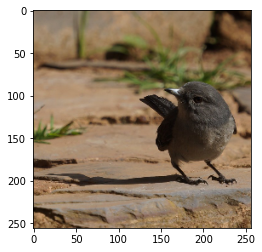

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


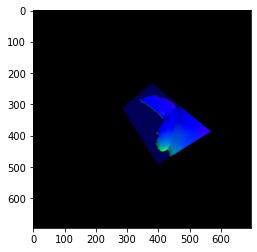

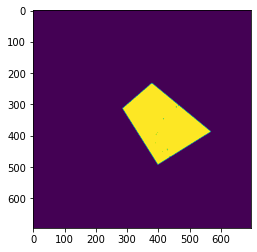

In [44]:
rgb, normal, mask, orig_size, name = test_dataset[10]
print(rgb.shape)
plt.imshow(rgb.transpose(1,2,0))
plt.show()
plt.imshow(normal.transpose(1,2,0))
plt.show()
plt.imshow(mask.transpose(1,2,0))
plt.show()


# Evaluation

In [46]:

def valid(model, coord_change, data_loader, dataset_name, max_iter=1400, 
          verbal=False, b_vis_normal=False, in_thresh = None, front_facing = False):
    print("Evaluation on {}".format(dataset_name))

    # NYU: x points left, y points down, z points toward us
    # SNOW: x points right, y points up, z points toward us
    # OASIS: x points right, y points down, z points toward us

    return valid_normals(model, 'OASIS', coord_change, data_loader, max_iter, verbal, front_facing, b_vis_normal)

def vis_normal(rgb, pred, gt):

    rgb = rgb * 255.0
    gt = gt * 255.0
    pred = pred * 255.0
    
    im = np.concatenate([rgb, gt, pred], axis=1)
    
#     if not is_color:
#         # BGR -> RGB
#         im = im[:,:,[2,1,0]]
    plt.figure(figsize=(20,10))
    plt.imshow(np.uint8(im))
    plt.show()

def valid_normals(model, type, coord_change, data_loader, max_iter, verbal, front_facing = False, b_vis_normal = False):
    def angle_error(preds, truths):
        '''
        preds and truths: Nx3 pytorch tensor
        '''
        preds_norm =  torch.nn.functional.normalize(preds, p=2, dim=1)
        truths_norm = torch.nn.functional.normalize(truths, p=2, dim=1)
        angles = torch.sum(preds_norm * truths_norm, dim=1)
                
        # Clip values so that max is 1 and min is -1, but don't change intermediate values
        angles = torch.clamp(angles, -1, 1)
        angles = torch.acos(angles)
        return angles

    # In degrees
    def mean(errors):
        error_sum = 0
        total_pixels = 0
        for matrix in errors:
            error_sum += np.sum(matrix)
            total_pixels += matrix.size
        return math.degrees(error_sum / total_pixels)

    # In degrees
    def median(errors):
        return math.degrees(np.median(np.concatenate(errors)))
  
    # 11.25, 22.5, 30
    def below_threshold(errors, thresh_angle):
        num = 0
        total_pixels = 0
        for matrix in errors:
            num += np.sum(matrix < math.radians(thresh_angle))
            total_pixels += matrix.size
        return num / total_pixels

  
    print("####################################")
    print("Evaluating...")
    print("\tfront_facing = %s"  %  front_facing)

    assert not model.training

    iter = 0
    with torch.no_grad():
        errors = []
        for step, data_tuple in enumerate(data_loader):
            if len(data_tuple) == 3:
                inputs, targets, target_res = data_tuple
            elif len(data_tuple) == 5:
                inputs, targets, masks, target_res, _ = data_tuple
                masks = masks.to(device)
            iter += 1
            if iter > max_iter:
                break
                
            input_var = Variable(inputs.to(device))
            output_var = model(input_var)
            targets = targets.to(device)
            

            # Shift coordinate systems
#             output_var[:,0,:,:] *= coord_change[0]
#             output_var[:,1,:,:] *= coord_change[1]
#             output_var[:,2,:,:] *= coord_change[2]

            ##### my code
            targets[:,0,:,:] *= coord_change[0]
            targets[:,1,:,:] *= coord_change[1]
            targets[:,2,:,:] *= coord_change[2]
            
            output_var = torch.clamp(output_var, 0, 1)
            targets = (targets + 1) / 2
            ############


            orig_height = target_res[0]
            orig_width = target_res[1]
            output_var = torch.nn.functional.interpolate(output_var, size=(orig_height, orig_width), mode='bilinear')
            targets = torch.nn.functional.interpolate(targets, size=(orig_height, orig_width), mode='bilinear')
            masks = torch.nn.functional.interpolate(masks, size=(orig_height, orig_width), mode='bilinear')
            mask = masks.byte().squeeze(1) # remove color channel        
#             output_var = torch.nn.functional.normalize(output_var, p=2, dim=1)
            output = output_var.permute(0,2,3,1)[mask, :]
            target = targets.permute(0,2,3,1)[mask, :]

            if front_facing :
                output[:,0] = 0 # output: torch.Size([N, 3])
                output[:,1] = 0
                output[:,2] = 1

        
            error = angle_error(output, target)

            errors.append(error.data.cpu().detach().numpy())

            if b_vis_normal and iter % 50 == 0:
                color = input_var[0,:,:,:].cpu().detach().numpy().transpose(1, 2, 0)
                pred = torch.clamp(output_var[0,:,:,:],0,1).cpu().detach().numpy().transpose(1, 2, 0)
                gt = targets[0,:,:,:].cpu().detach().numpy().transpose(1, 2, 0)
                color = cv2.resize(color, (orig_height, orig_width))
                vis_normal(color, pred, gt)


#             if iter % 50 == 0:
#                 print("Iter {}: {} mean radian error".format(iter, np.mean(np.concatenate(errors))))
#                 sys.stdout.flush()
              
        MAE = mean(errors)
        print("Mean angle error: {} degs".format(MAE))
        below_1125 = below_threshold(errors, 11.25)
        print("% below 11.25 deg: {}".format(below_1125))
        below_225 = below_threshold(errors, 22.5)
        print("% below 22.5 deg: {}".format(below_225))
        below_30 = below_threshold(errors, 30)
        print("% below 30 deg: {}".format(below_30))
        MDAE = median(errors)
        print("Median angle error: {} degs".format(MDAE))
        sys.stdout.flush()

        results = {}
        results['MAE'] = MAE
        results['MDAE'] = MDAE
        results['11.25'] = below_1125
        results['22.5'] = below_225
        results['30'] = below_30
        return results

Evaluation on OASISNormalDatasetVal
####################################
Evaluating...
	front_facing = False


<ipython-input-34-99346270f0a1>:109: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1595629411241/work/aten/src/ATen/native/IndexingUtils.h:20.)
  output = output_var.permute(0,2,3,1)[mask, :]
<ipython-input-34-99346270f0a1>:110: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1595629411241/work/aten/src/ATen/native/IndexingUtils.h:20.)
  target = targets.permute(0,2,3,1)[mask, :]


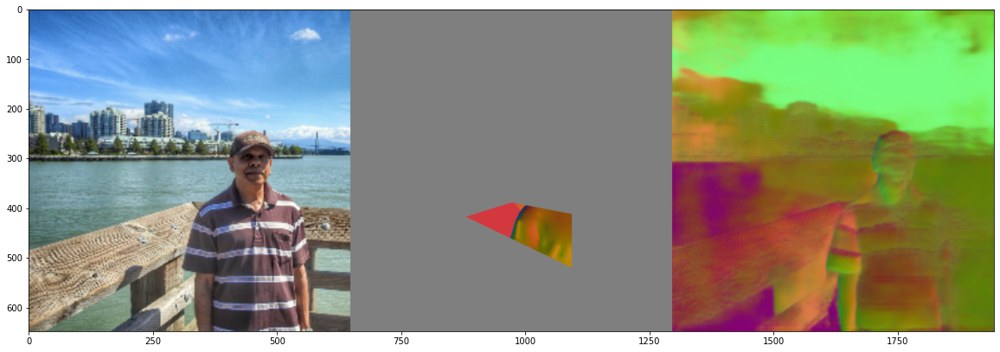

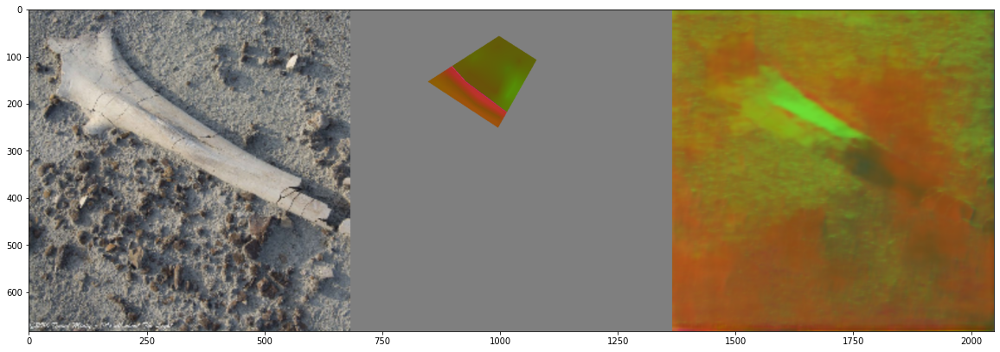

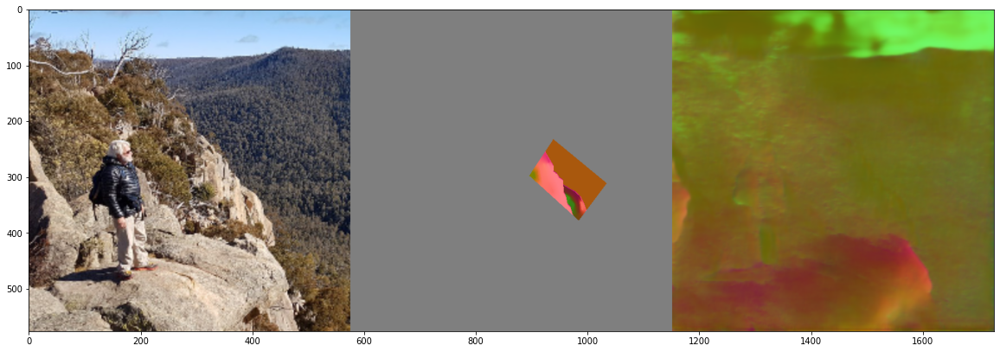

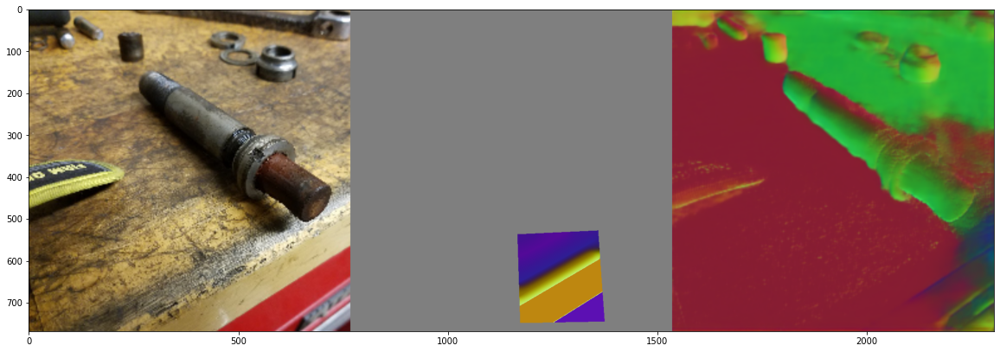

In [ ]:
num_iters = 500
b_vis_normal = True
front_facing = False
in_thresh = 0.0
model.eval()
test_rel_error = valid(model, [1., 1., -1.], test_data_loader, dataset_name, 
                               max_iter = num_iters, in_thresh=in_thresh, b_vis_normal=b_vis_normal, 
                               verbal=True, front_facing=front_facing)

In [23]:
num_iters = 10000
b_vis_normal = True
front_facing = False
in_thresh = 0.0
model.eval()
test_rel_error = valid(model, [1., 1., -1.], test_data_loader, dataset_name, 
                               max_iter = num_iters, in_thresh=in_thresh, b_vis_normal=b_vis_normal, 
                               verbal=True, front_facing=front_facing)

Evaluation on OASISNormalDatasetVal
####################################
Evaluating...
	front_facing = False


<ipython-input-22-4bf7da613548>:109: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1595629411241/work/aten/src/ATen/native/IndexingUtils.h:20.)
  output = output_var.permute(0,2,3,1)[mask, :]
<ipython-input-22-4bf7da613548>:110: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1595629411241/work/aten/src/ATen/native/IndexingUtils.h:20.)
  target = targets.permute(0,2,3,1)[mask, :]


://
Mean angle error: 17.84144600545856 degs
% below 11.25 deg: 0.38946484059298014
% below 22.5 deg: 0.7207117699206926
% below 30 deg: 0.8279932953998448
Median angle error: 14.092334017289094 degs


# New model with augmentation

Evaluation on OASISNormalDatasetVal
####################################
Evaluating...
	front_facing = False


<ipython-input-34-99346270f0a1>:109: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1595629411241/work/aten/src/ATen/native/IndexingUtils.h:20.)
  output = output_var.permute(0,2,3,1)[mask, :]
<ipython-input-34-99346270f0a1>:110: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1595629411241/work/aten/src/ATen/native/IndexingUtils.h:20.)
  target = targets.permute(0,2,3,1)[mask, :]


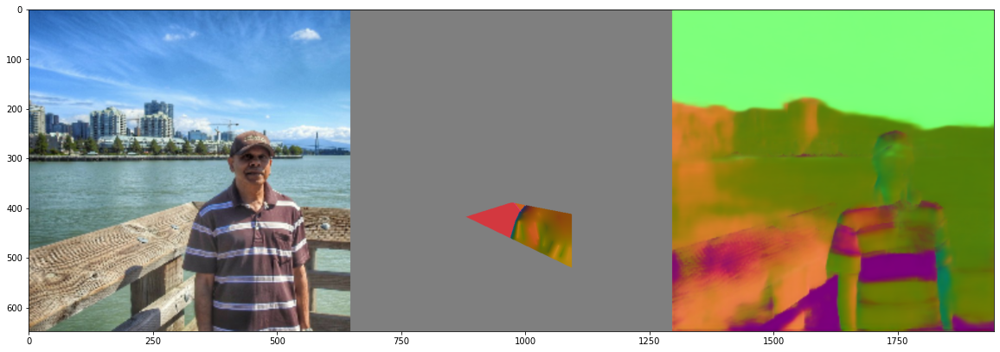

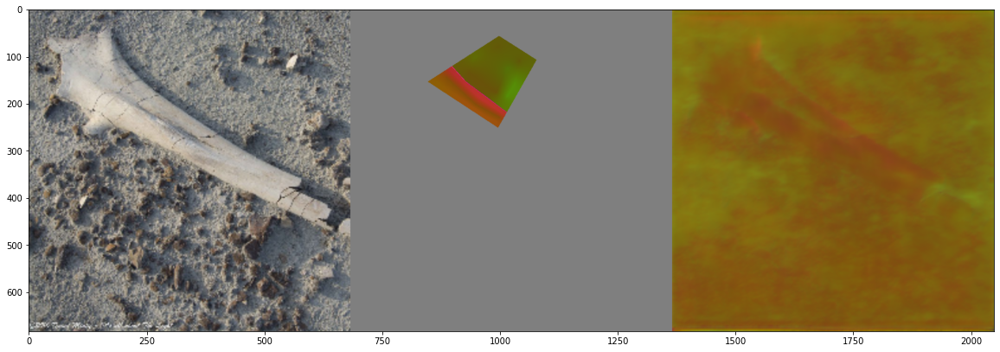

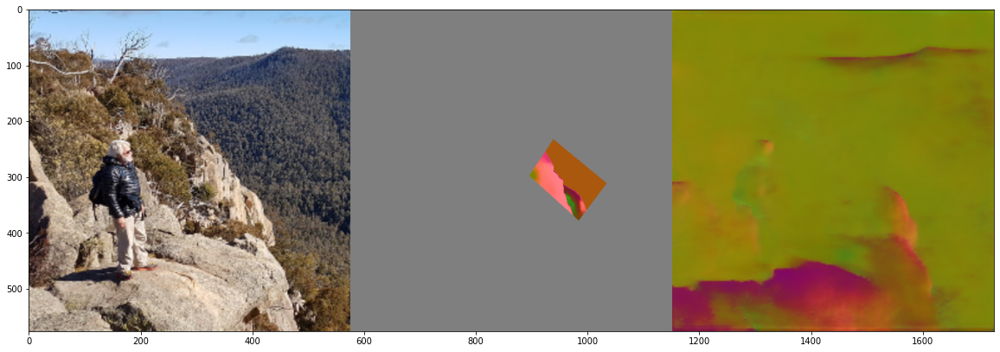

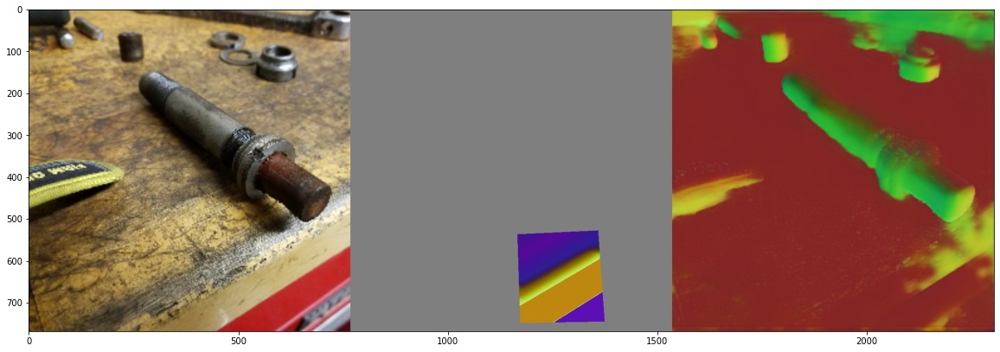

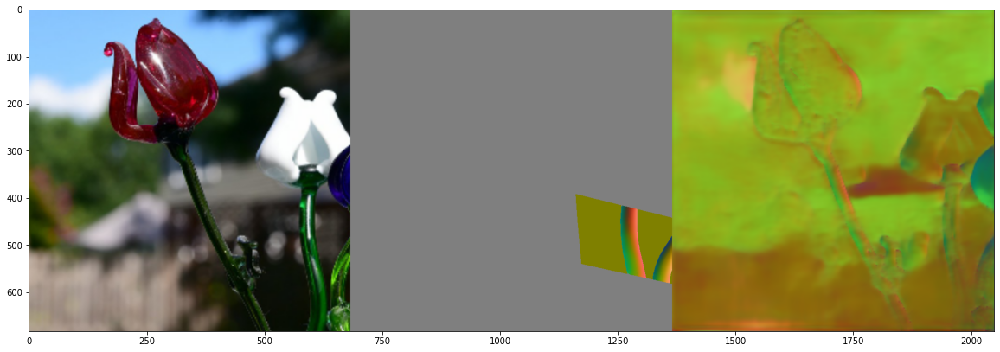

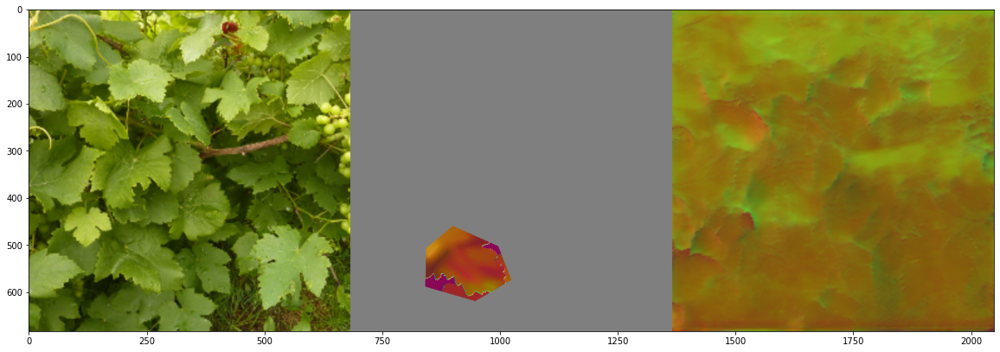

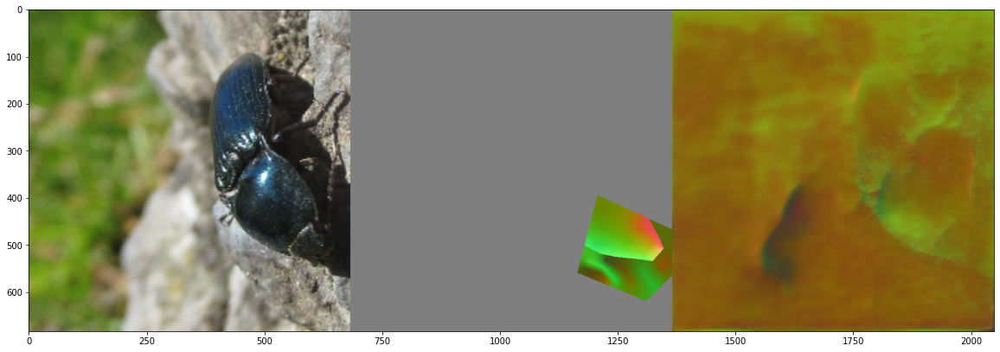

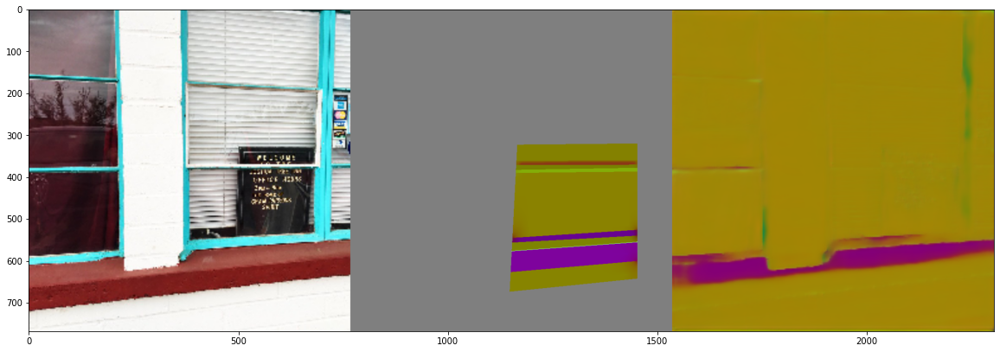

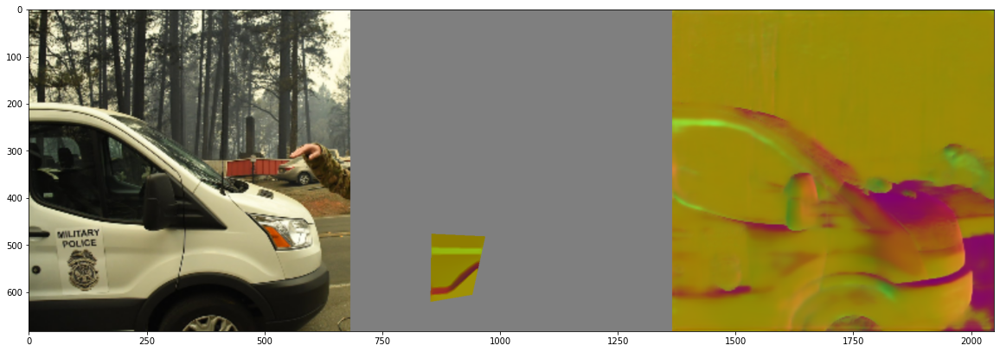

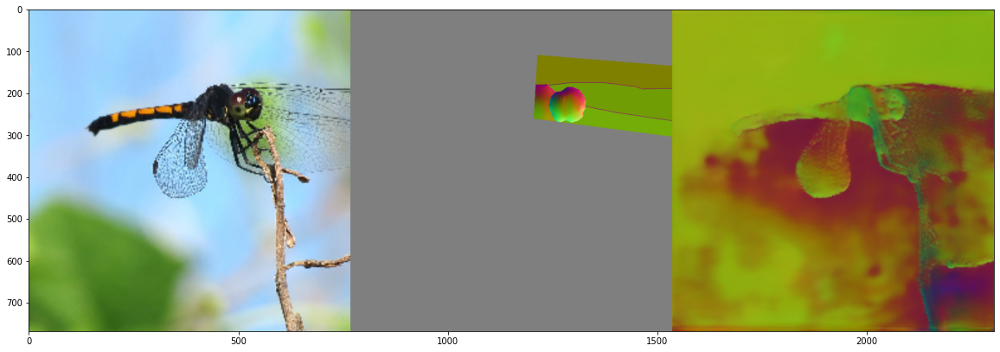

Mean angle error: 16.593149210901785 degs
% below 11.25 deg: 0.493427953124612
% below 22.5 deg: 0.7517118813606822
% below 30 deg: 0.829074630838867
Median angle error: 11.439485982335203 degs


In [35]:
num_iters = 500
b_vis_normal = True
front_facing = False
in_thresh = 0.0
model.eval()
test_rel_error = valid(model, [1., 1., -1.], test_data_loader, dataset_name, 
                               max_iter = num_iters, in_thresh=in_thresh, b_vis_normal=b_vis_normal, 
                               verbal=True, front_facing=front_facing)

In [33]:
num_iters = 10000
b_vis_normal = True
front_facing = False
in_thresh = 0.0
model.eval()
test_rel_error = valid(model, [1., 1., -1.], test_data_loader, dataset_name, 
                               max_iter = num_iters, in_thresh=in_thresh, b_vis_normal=b_vis_normal, 
                               verbal=True, front_facing=front_facing)

Evaluation on OASISNormalDatasetVal
####################################
Evaluating...
	front_facing = False


<ipython-input-30-4bf7da613548>:109: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1595629411241/work/aten/src/ATen/native/IndexingUtils.h:20.)
  output = output_var.permute(0,2,3,1)[mask, :]
<ipython-input-30-4bf7da613548>:110: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1595629411241/work/aten/src/ATen/native/IndexingUtils.h:20.)
  target = targets.permute(0,2,3,1)[mask, :]


://
Mean angle error: 16.933155924495836 degs
% below 11.25 deg: 0.4792023349862256
% below 22.5 deg: 0.7396589926311139
% below 30 deg: 0.8282859340018404
Median angle error: 11.830249642488095 degs


# Full Baseline

Evaluation on OASISNormalDatasetVal
####################################
Evaluating...
	front_facing = False


<ipython-input-46-99346270f0a1>:109: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1595629411241/work/aten/src/ATen/native/IndexingUtils.h:20.)
  output = output_var.permute(0,2,3,1)[mask, :]
<ipython-input-46-99346270f0a1>:110: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1595629411241/work/aten/src/ATen/native/IndexingUtils.h:20.)
  target = targets.permute(0,2,3,1)[mask, :]


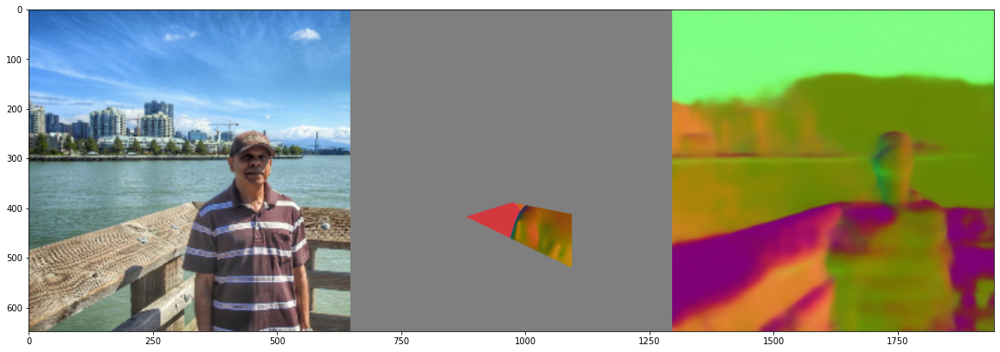

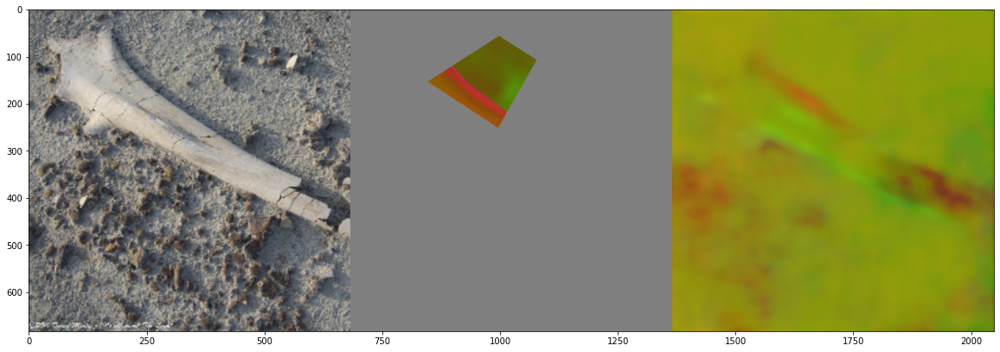

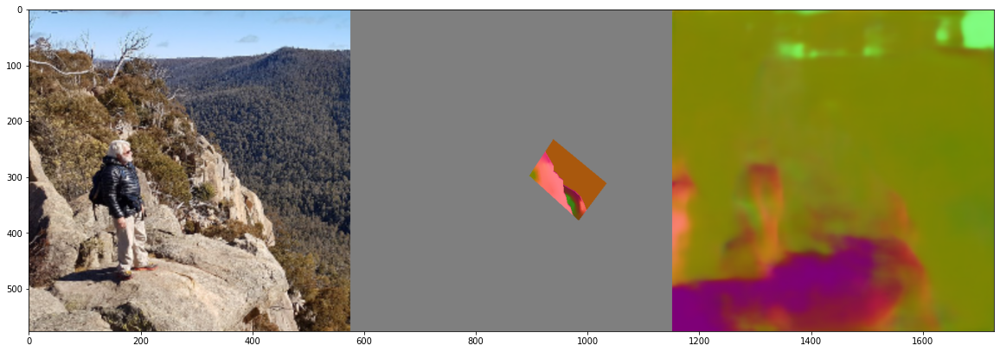

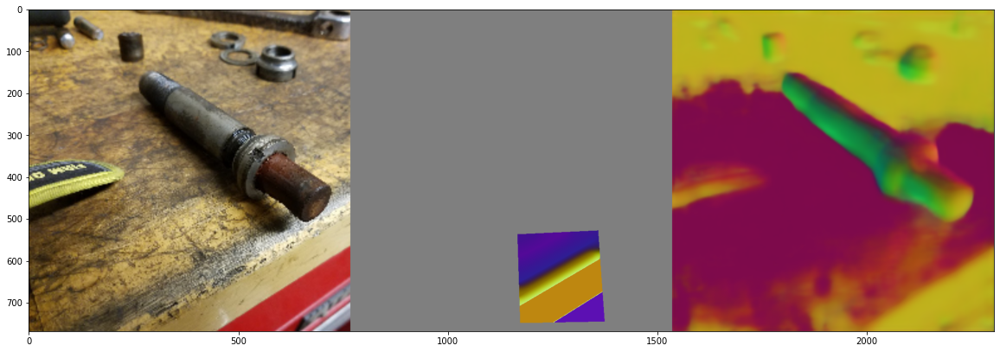

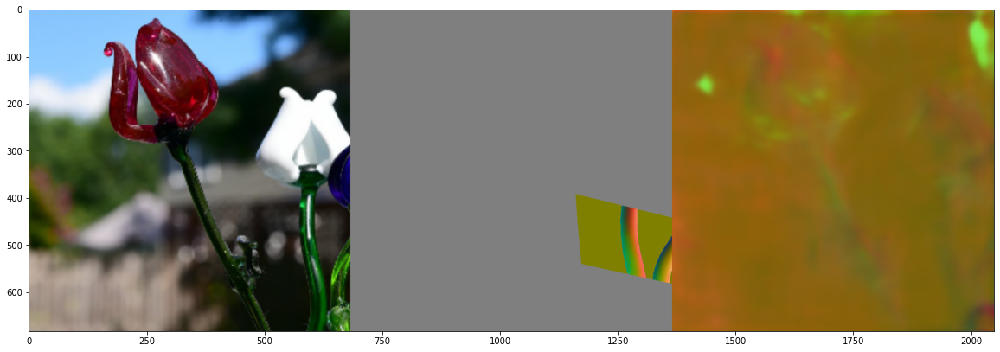

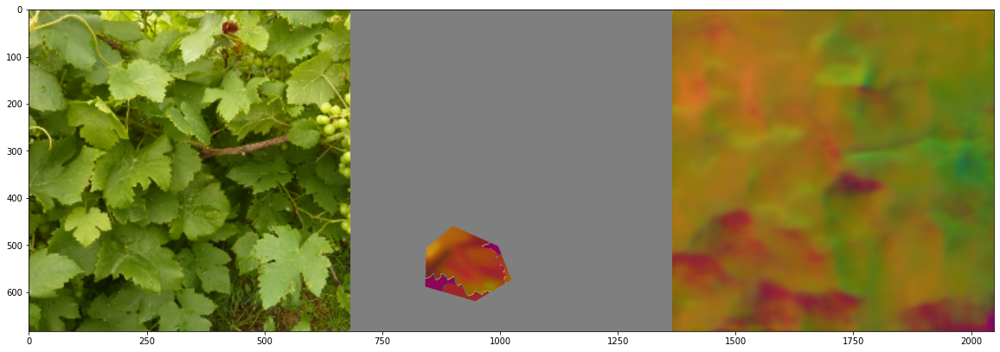

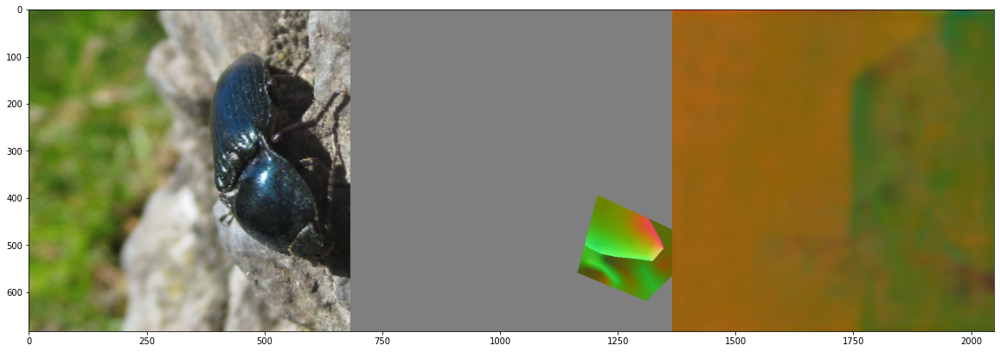

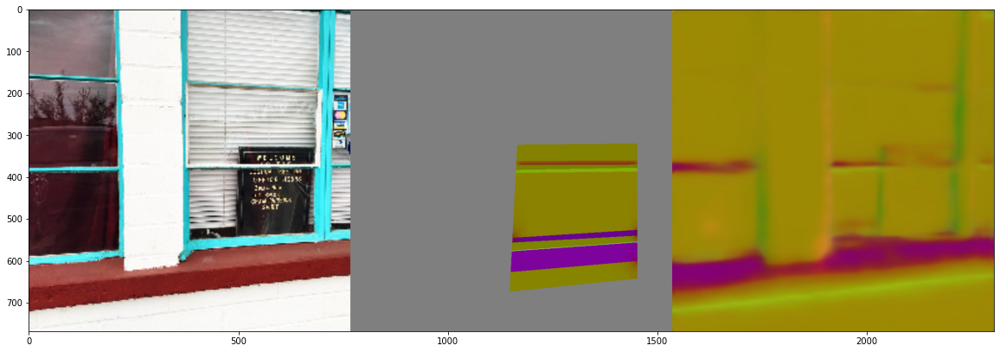

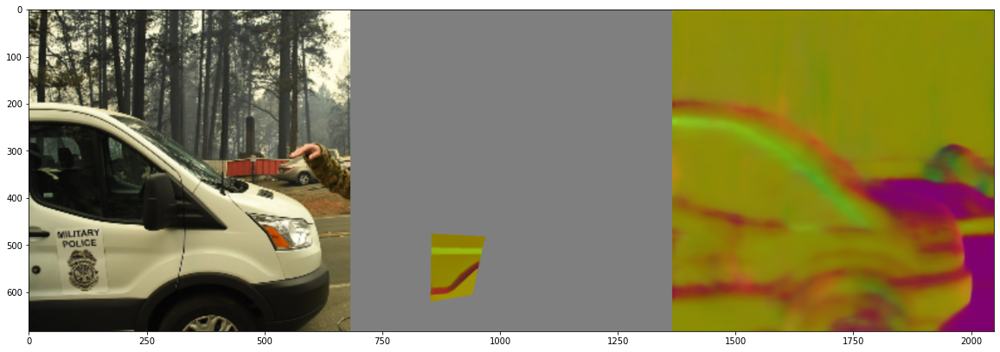

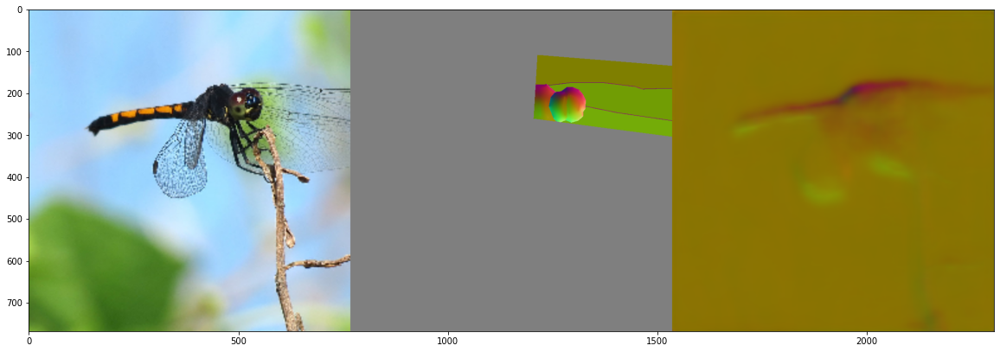

Mean angle error: 16.035831691160915 degs
% below 11.25 deg: 0.5114826590138324
% below 22.5 deg: 0.7549903637318613
% below 30 deg: 0.833588129525714
Median angle error: 10.86848387526943 degs


In [47]:
num_iters = 500
b_vis_normal = True
front_facing = False
in_thresh = 0.0
model.eval()
test_rel_error = valid(model, [1., 1., -1.], test_data_loader, dataset_name, 
                               max_iter = num_iters, in_thresh=in_thresh, b_vis_normal=b_vis_normal, 
                               verbal=True, front_facing=front_facing)

In [48]:
pretrained_weights_path

'/scratch/ainaz/XTConsistency/models/rgb2normal_baseline.pth'